<a href="https://colab.research.google.com/github/menna03/Insurance-Dataset/blob/main/Insurance.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
import pandas as pd

# Read the CSV files into dataframes
df = pd.read_csv("/content/insurance.csv")

In [ ]:
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


# LabelEncoder

In [ ]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
# Define the categorical columns
categorical_cols = ['sex', 'smoker', 'region']

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Iterate over each categorical column and convert it to numeric values
for col in categorical_cols:
    df[col] = label_encoder.fit_transform(df[col])

# Hopkins statistic

In [ ]:
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
import numpy as np
from math import isnan

def hopkins(X):
    d = X.shape[1]
    #d = len(vars) # columns
    n = len(X) # rows
    m = int(0.1 * n) # the sample with size of 10% of the data we have
    nbrs = NearestNeighbors(n_neighbors=3).fit(X.values)

    rand_X = sample(range(0, n, 1), m)

    ujd = [] #the distances of the nearest neighbors in the randomly generated datasets
    wjd = [] #the distances of nearest neighbors in the data set

    #calculating the hopkins statistics as the ratio of ujd to the total sum of both ujd,wjd
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])

    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0

    return H

In [ ]:
hopkin=hopkins(df)
print('Hopkins measure: ',hopkin)

Hopkins measure:  0.9357020002439028


Good measure for Hopkins

# k mean

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

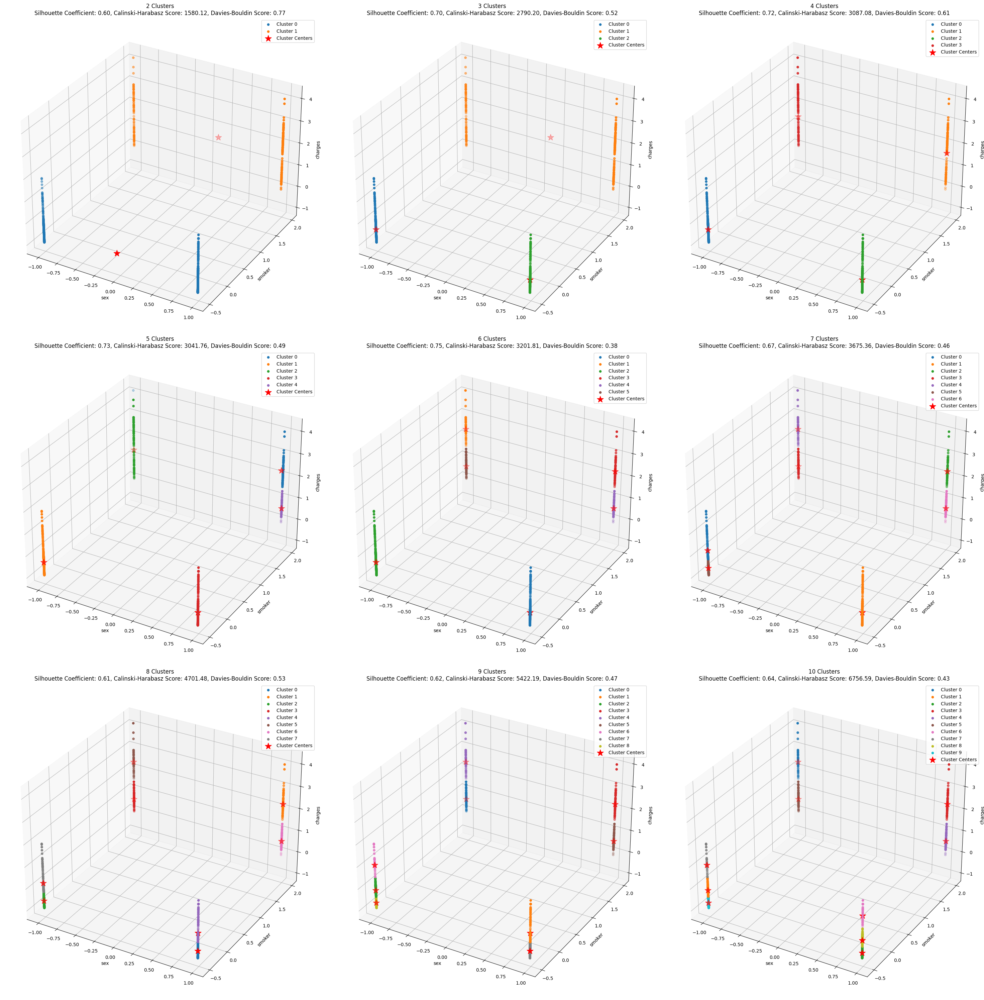

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Select the features to use for clustering
selected_features = ['sex', 'smoker', 'charges']

# Extract the selected features from the data
selected_data = df[selected_features]

# Standardize the selected features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(selected_data)

# Create a figure for subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 30), subplot_kw={'projection': '3d'})

# Iterate through different numbers of clusters and visualize
for n_clusters, ax in zip(range(2, 11), axes.flat):
    # Perform K-Means Clustering
    kmeans = KMeans(n_clusters=n_clusters)
    cluster_labels = kmeans.fit_predict(X_scaled)
    cluster_centers = kmeans.cluster_centers_

    # Calculate silhouette coefficient, Calinski-Harabasz score, and Davies-Bouldin score
    silhouette = silhouette_score(X_scaled, cluster_labels)
    calinski_harabasz = calinski_harabasz_score(X_scaled, cluster_labels)
    davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels)

    # Scatter plot for each cluster
    for cluster_label in range(n_clusters):
        cluster_points = X_scaled[cluster_labels == cluster_label]
        ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f'Cluster {cluster_label}')

    # Markers for cluster centers
    ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2],
               marker='*', color='red', s=200, label='Cluster Centers')

    ax.set_xlabel(selected_features[0])
    ax.set_ylabel(selected_features[1])
    ax.set_zlabel(selected_features[2])
    ax.set_title(f'{n_clusters} Clusters\n'
                 f'Silhouette Coefficient: {silhouette:.2f}, '
                 f'Calinski-Harabasz Score: {calinski_harabasz:.2f}, '
                 f'Davies-Bouldin Score: {davies_bouldin:.2f}')
    ax.legend()

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Initialize an empty list to store cluster centers
centers_data = []

# Iterate through different numbers of clusters and get the cluster centers
for n_clusters in range(2, 11):
    # Perform K-Medoids Clustering
    kmedoids = KMedoids(n_clusters=n_clusters)
    cluster_labels = kmedoids.fit_predict(X_scaled)
    cluster_centers = kmedoids.cluster_centers_

    # Append cluster centers to the list
    for i, center in enumerate(cluster_centers):
        centers_data.append(list(center) + [i])

# Create DataFrame from the list of cluster centers
centers_df = pd.DataFrame(centers_data, columns=selected_features + ['Cluster'])

# Group DataFrame by Cluster
grouped_centers = centers_df.groupby('Cluster')

# Display each cluster's center coordinates in a separate table
for cluster_number, cluster_data in grouped_centers:
    print(f"Cluster {cluster_number} Center Coordinates:")
    print(cluster_data[selected_features])
    print()


Cluster 0 Center Coordinates:
         sex    smoker   charges
0  -1.010519 -0.507463 -0.391207
2   0.989591  1.970587  1.779032
5  -1.010519 -0.507463 -0.003830
9  -1.010519 -0.507463 -0.720846
14 -1.010519 -0.507463 -0.720846
20 -1.010519 -0.507463 -0.116807
27 -1.010519 -0.507463 -0.417936
35 -1.010519 -0.507463 -0.483188
44 -1.010519 -0.507463 -0.663307

Cluster 1 Center Coordinates:
         sex    smoker   charges
1   0.989591 -0.507463 -0.397556
3  -1.010519 -0.507463 -0.465088
6  -1.010519 -0.507463 -0.702525
10  0.989591 -0.507463 -0.160564
15  0.989591 -0.507463 -0.503661
21  0.989591 -0.507463 -0.503661
28  0.989591 -0.507463 -0.503661
36  0.989591 -0.507463 -0.503661
45  0.989591 -0.507463 -0.503661

Cluster 2 Center Coordinates:
         sex    smoker   charges
4   0.989591 -0.507463 -0.519179
7   0.989591 -0.507463  0.046317
11  0.989591 -0.507463 -0.771158
16  0.989591 -0.507463 -0.889959
22 -1.010519 -0.507463 -0.736309
29 -1.010519 -0.507463 -0.815998
37 -1.010519 -0.5

In [ ]:
import pandas as pd

# Initialize an empty list to store cluster centers
centers_data = []

# Iterate through different numbers of clusters and get the cluster centers
for n_clusters in range(2, 11):
    # Perform K-Medoids Clustering
    kmedoids = KMedoids(n_clusters=n_clusters)
    cluster_labels = kmedoids.fit_predict(X_scaled)
    cluster_centers = kmedoids.cluster_centers_

    # Append cluster centers to the list
    for cluster_label, center in zip(range(n_clusters), cluster_centers):
        centers_data.append(list(center) + [cluster_label])

# Create DataFrame from the list of cluster centers
centers_df = pd.DataFrame(centers_data, columns=selected_features + ['Cluster'])

# Group DataFrame by Cluster
grouped_centers = centers_df.groupby('Cluster')

# Display each cluster's center coordinates in a separate table
for cluster_number, cluster_data in grouped_centers:
    print(f"Cluster {10-cluster_number} Center Coordinates:")
    print(cluster_data[selected_features])
    print()


Cluster 10 Center Coordinates:
         sex    smoker   charges
0  -1.010519 -0.507463 -0.391207
2   0.989591  1.970587  1.779032
5  -1.010519 -0.507463 -0.003830
9  -1.010519 -0.507463 -0.720846
14 -1.010519 -0.507463 -0.720846
20 -1.010519 -0.507463 -0.116807
27 -1.010519 -0.507463 -0.417936
35 -1.010519 -0.507463 -0.483188
44 -1.010519 -0.507463 -0.663307

Cluster 9 Center Coordinates:
         sex    smoker   charges
1   0.989591 -0.507463 -0.397556
3  -1.010519 -0.507463 -0.465088
6  -1.010519 -0.507463 -0.702525
10  0.989591 -0.507463 -0.160564
15  0.989591 -0.507463 -0.503661
21  0.989591 -0.507463 -0.503661
28  0.989591 -0.507463 -0.503661
36  0.989591 -0.507463 -0.503661
45  0.989591 -0.507463 -0.503661

Cluster 8 Center Coordinates:
         sex    smoker   charges
4   0.989591 -0.507463 -0.519179
7   0.989591 -0.507463  0.046317
11  0.989591 -0.507463 -0.771158
16  0.989591 -0.507463 -0.889959
22 -1.010519 -0.507463 -0.736309
29 -1.010519 -0.507463 -0.815998
37 -1.010519 -0.

# Fuzzy Kmean

In [ ]:
!pip install scikit-learn-extra
!pip install scikit-fuzzy


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.0/994.0 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.4.2-py3-none-any.whl size=894078 sha256=638bc1d6dfc49a6009827944d233c2e3931507de746c37691aaf153881abb7aa
  Stored in directory: /root/.cache/pip/wheels/4f/86/1b/dfd97134a2c8313e519bcebd95d3fedc7be7944db022094bc8
Successfully built scikit-fuzzy


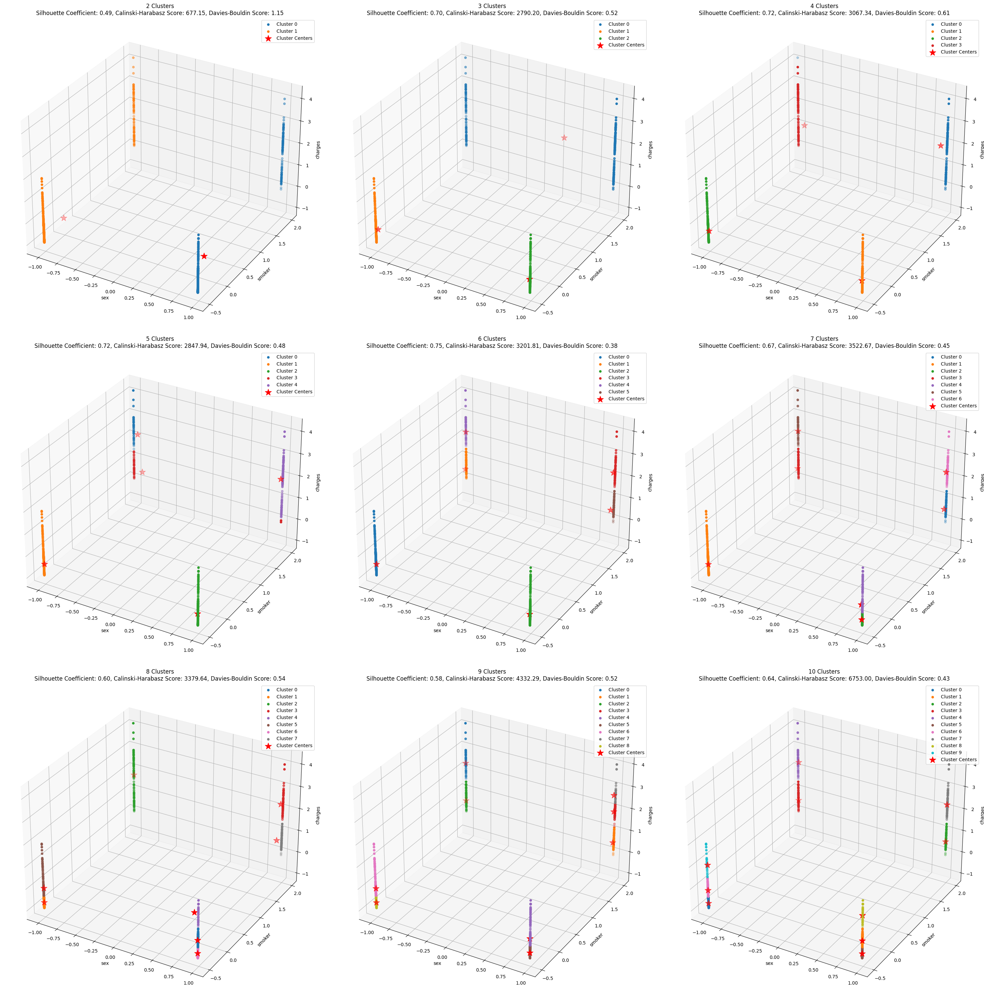

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from skfuzzy.cluster import cmeans

# Select the features to use for clustering
selected_features = ['sex', 'smoker', 'charges']

# Extract the selected features from the data
selected_data = df[selected_features]

# Standardize the selected features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(selected_data)

# Create a figure for subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 30), subplot_kw={'projection': '3d'})

# Iterate through different numbers of clusters and visualize
for n_clusters, ax in zip(range(2, 11), axes.flat):
    # Perform Fuzzy K-Means Clustering
    cntr, u, u0, d, jm, p, fpc = cmeans(X_scaled.T, n_clusters, 2, error=0.005, maxiter=1000)

    # Get the cluster labels
    cluster_labels = u.argmax(axis=0)

    # Calculate silhouette coefficient, Calinski-Harabasz score, and Davies-Bouldin score
    silhouette = silhouette_score(X_scaled, cluster_labels)
    calinski_harabasz = calinski_harabasz_score(X_scaled, cluster_labels)
    davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels)

    # Scatter plot for each cluster
    for cluster_label in range(n_clusters):
        cluster_points = X_scaled[cluster_labels == cluster_label]
        ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f'Cluster {cluster_label}')

    # Markers for cluster centers
    ax.scatter(cntr[:, 0], cntr[:, 1], cntr[:, 2],
               marker='*', color='red', s=200, label='Cluster Centers')

    ax.set_xlabel(selected_features[0])
    ax.set_ylabel(selected_features[1])
    ax.set_zlabel(selected_features[2])
    ax.set_title(f'{n_clusters} Clusters\n'
                 f'Silhouette Coefficient: {silhouette:.2f}, '
                 f'Calinski-Harabasz Score: {calinski_harabasz:.2f}, '
                 f'Davies-Bouldin Score: {davies_bouldin:.2f}')
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

# Initialize an empty list to store cluster centers
centers_data = []

# Iterate through different numbers of clusters and get the cluster centers
for n_clusters in range(2, 11):
    # Perform K-Medoids Clustering
    kmedoids = KMedoids(n_clusters=n_clusters)
    cluster_labels = kmedoids.fit_predict(X_scaled)
    cluster_centers = kmedoids.cluster_centers_

    # Append cluster centers to the list
    for i, center in enumerate(cluster_centers):
        centers_data.append(list(center) + [i])

# Create DataFrame from the list of cluster centers
centers_df = pd.DataFrame(centers_data, columns=selected_features + ['Cluster'])

In [ ]:
# Group DataFrame by Cluster
grouped_centers = centers_df.groupby('Cluster')

# Display each cluster's center coordinates in a separate table
for cluster_number, cluster_data in grouped_centers:
    print(f"Cluster {cluster_number} Center Coordinates:")
    print(cluster_data[selected_features])
    print()


Cluster 0 Center Coordinates:
         sex    smoker   charges
0  -1.010519 -0.507463 -0.391207
2   0.989591  1.970587  1.779032
5  -1.010519 -0.507463 -0.003830
9  -1.010519 -0.507463 -0.720846
14 -1.010519 -0.507463 -0.720846
20 -1.010519 -0.507463 -0.116807
27 -1.010519 -0.507463 -0.417936
35 -1.010519 -0.507463 -0.483188
44 -1.010519 -0.507463 -0.663307

Cluster 1 Center Coordinates:
         sex    smoker   charges
1   0.989591 -0.507463 -0.397556
3  -1.010519 -0.507463 -0.465088
6  -1.010519 -0.507463 -0.702525
10  0.989591 -0.507463 -0.160564
15  0.989591 -0.507463 -0.503661
21  0.989591 -0.507463 -0.503661
28  0.989591 -0.507463 -0.503661
36  0.989591 -0.507463 -0.503661
45  0.989591 -0.507463 -0.503661

Cluster 2 Center Coordinates:
         sex    smoker   charges
4   0.989591 -0.507463 -0.519179
7   0.989591 -0.507463  0.046317
11  0.989591 -0.507463 -0.771158
16  0.989591 -0.507463 -0.889959
22 -1.010519 -0.507463 -0.736309
29 -1.010519 -0.507463 -0.815998
37 -1.010519 -0.5

# K-Medoid

In [ ]:
pip install scikit-learn-extra

In [ ]:
from sklearn_extra.cluster import KMedoids

# Select the features to use for clustering , ###bmi,charges,sex=771 -> better graph age,smoker,charges=521 ta2reban
#sex,smoker,charges are the best so far just in case lw 7asal 2elet adab
selected_features = ['sex', 'smoker', 'charges']

# Extract the selected features from the data
selected_data = df[selected_features]

# Standardize the selected features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(selected_data)

# Perform K-Medoids Clustering with different numbers of clusters and initializations
best_inertia = np.inf


for n_clusters in range(2, 10):  # try number of clusters from 2 to 10
    for random_state in range(10):  # try 10 different random initializations
        kmedoids = KMedoids(n_clusters=n_clusters, random_state=random_state)
        kmedoids.fit(X_scaled)
        if kmedoids.inertia_ < best_inertia:
            best_inertia = kmedoids.inertia_


### the lower inertia the better as it tells that the data has more cohesion
print("Best inertia: ", best_inertia)


Best inertia:  365.13885745548237


In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Predict cluster labels
cluster_labels = best_kmedoids.labels_

# Silhouette coefficient
silhouette = silhouette_score(X_scaled, cluster_labels)

# Calinski-Harabasz score
calinski_harabasz = calinski_harabasz_score(X_scaled, cluster_labels)

# Davies-Bouldin score
davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels)

print("Silhouette Coefficient:", silhouette)
print("Calinski-Harabasz Score:", calinski_harabasz)
print("Davies-Bouldin Score:", davies_bouldin)


Silhouette Coefficient: 0.5329259467802452
Calinski-Harabasz Score: 2084.556362028302
Davies-Bouldin Score: 0.6241262044242547


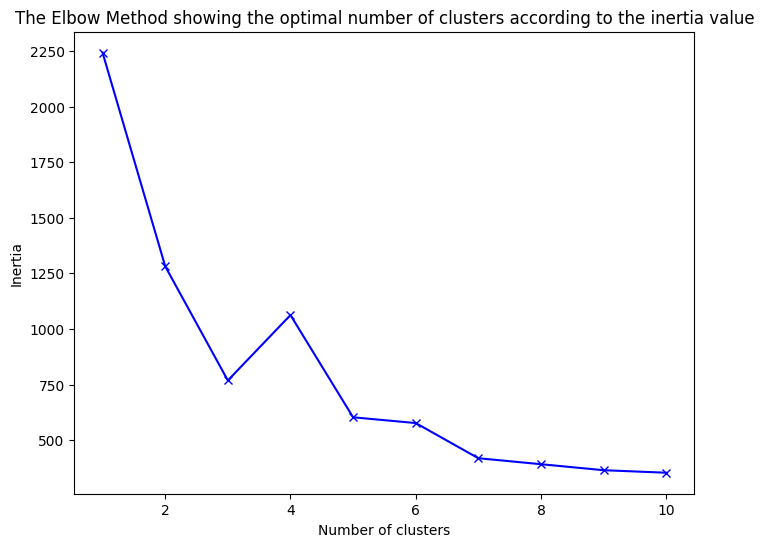

In [ ]:
import matplotlib.pyplot as plt

# List to hold the inertia for each number of clusters
inertia_list = []

# Range of number of clusters to try
num_clusters = range(1, 11)

# Perform K-Medoids clustering for each number of clusters and record the inertia
for n in num_clusters:
    kmedoids = KMedoids(n_clusters=n, random_state=0)
    kmedoids.fit(X_scaled)
    inertia_list.append(kmedoids.inertia_)

plt.figure(figsize=(8, 6))
plt.plot(num_clusters, inertia_list, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('The Elbow Method showing the optimal number of clusters according to the inertia value')
plt.show()



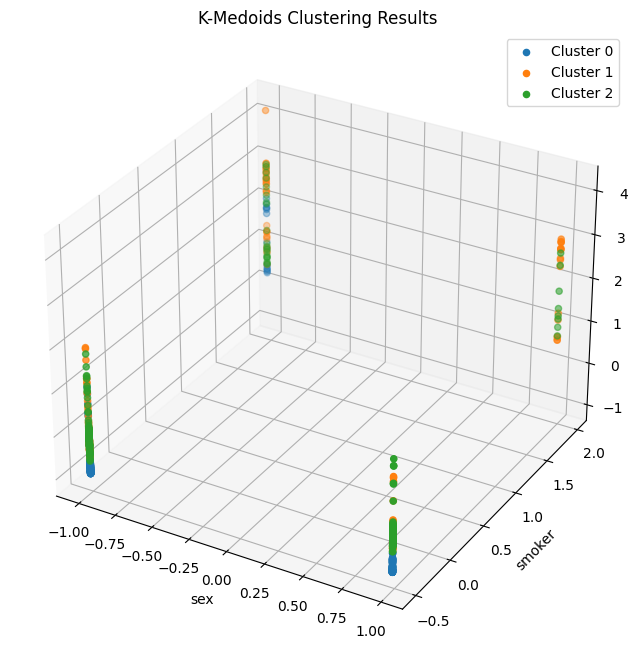

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Set the number of clusters to 3
n_clusters = 3

# Assuming `best_kmedoids` is your KMedoids model
best_kmedoids.n_clusters = n_clusters

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for each cluster
for cluster_label in range(n_clusters):
    cluster_points = X_scaled[cluster_labels == cluster_label]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f'Cluster {cluster_label}')

ax.set_xlabel(selected_features[0])
ax.set_ylabel(selected_features[1])
ax.set_zlabel(selected_features[2])
ax.set_title('K-Medoids Clustering Results')

plt.legend()
plt.show()



In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

# Set the number of clusters to 3
n_clusters = 3

# Assuming `best_kmedoids` is your KMedoids model
best_kmedoids.n_clusters = n_clusters


# Scatter plot for each cluster
cluster_data = []
for cluster_label in range(n_clusters):
    cluster_points = X_scaled[cluster_labels == cluster_label]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f'Cluster {cluster_label}')
    cluster_data.append(pd.DataFrame(cluster_points, columns=selected_features))

# Display cluster points in a table format
for i, data in enumerate(cluster_data):
    print(f"Cluster {i} points:")
    display(data)

Cluster 0 points:


,sex,smoker,charges
0,-1.010519,-0.507463,-0.753434
1,-1.010519,-0.507463,-0.708986
2,-1.010519,-0.507463,-0.687347
3,-1.010519,-0.507463,-0.574670
4,-1.010519,-0.507463,-0.601455
...,...,...,...
116,-1.010519,-0.507463,-0.736309
117,-1.010519,-0.507463,-0.750181
118,-1.010519,-0.507463,-0.644169
119,-1.010519,-0.507463,-0.737681


Cluster 1 points:


,sex,smoker,charges
0,0.989591,-0.507463,-0.567017
1,0.989591,-0.507463,-0.583745
2,0.989591,-0.507463,-0.578081
3,0.989591,-0.507463,-0.594008
4,0.989591,-0.507463,-0.385297
...,...,...,...
167,0.989591,-0.507463,-0.661597
168,0.989591,-0.507463,-0.528228
169,0.989591,-0.507463,-0.522863
170,0.989591,-0.507463,-0.648086


Cluster 2 points:


,sex,smoker,charges
0,-1.010519,-0.507463,-0.785908
1,-1.010519,-0.507463,-0.914646
2,-1.010519,-0.507463,-0.844606
3,-1.010519,-0.507463,-0.815917
4,-1.010519,-0.507463,-0.802405
...,...,...,...
115,-1.010519,-0.507463,-0.892637
116,-1.010519,-0.507463,-0.953183
117,-1.010519,-0.507463,-0.914002
118,-1.010519,-0.507463,-0.961596


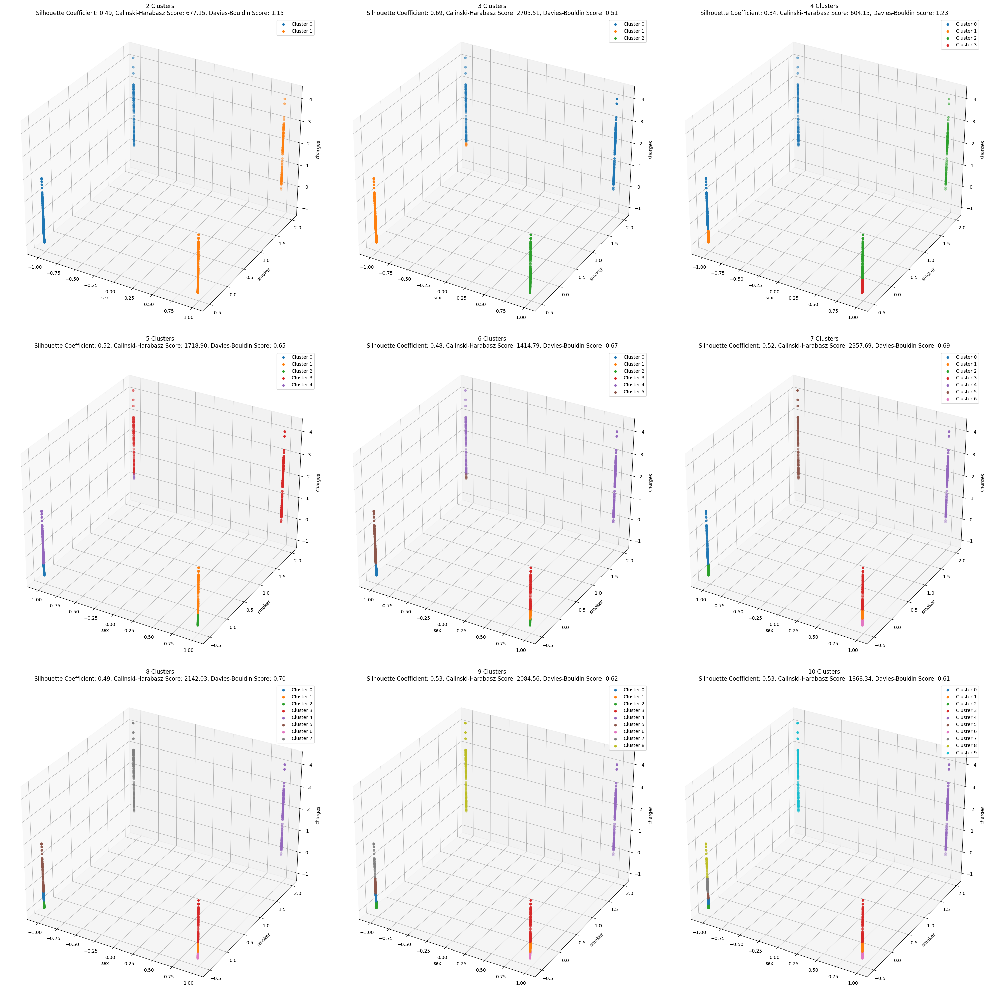

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn_extra.cluster import KMedoids

selected_features = ['sex', 'smoker', 'charges']

# Extract the selected features from the data
selected_data = df[selected_features]

# Standardize the selected features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(selected_data)

fig, axes = plt.subplots(3, 3, figsize=(30, 30), subplot_kw={'projection': '3d'})

# Iterate through different numbers of clusters and visualize
for n_clusters, ax in zip(range(2, 11), axes.flat):
    # Perform K-Medoids Clustering
    kmedoids = KMedoids(n_clusters=n_clusters)
    cluster_labels = kmedoids.fit_predict(X_scaled)

    # Calculate silhouette coefficient, Calinski-Harabasz score, and Davies-Bouldin score
    silhouette = silhouette_score(X_scaled, cluster_labels)
    calinski_harabasz = calinski_harabasz_score(X_scaled, cluster_labels)
    davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels)

    # Scatter plot for each cluster
    for cluster_label in range(n_clusters):
        cluster_points = X_scaled[cluster_labels == cluster_label]
        ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f'Cluster {cluster_label}')

    ax.set_xlabel(selected_features[0])
    ax.set_ylabel(selected_features[1])
    ax.set_zlabel(selected_features[2])
    ax.set_title(f'{n_clusters} Clusters\n'
                 f'Silhouette Coefficient: {silhouette:.2f}, '
                 f'Calinski-Harabasz Score: {calinski_harabasz:.2f}, '
                 f'Davies-Bouldin Score: {davies_bouldin:.2f}')
    ax.legend()

plt.tight_layout()
plt.show()


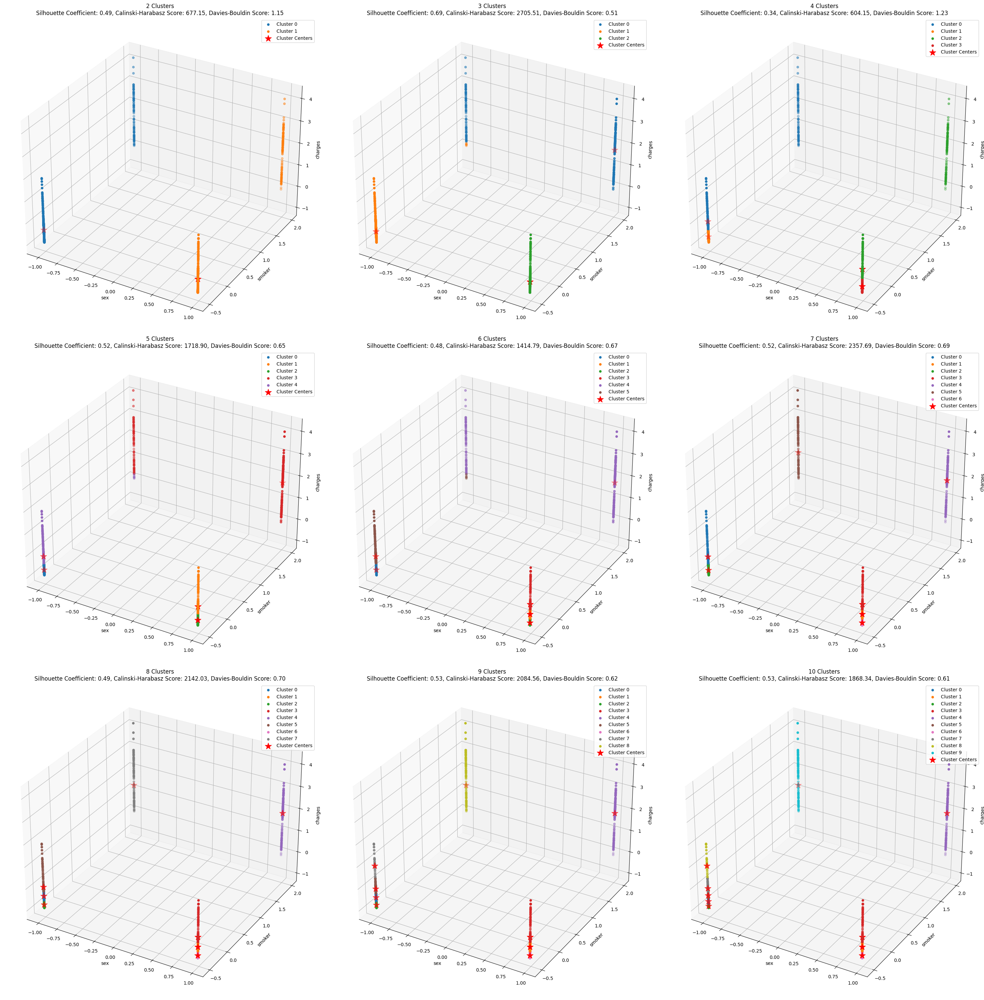

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn_extra.cluster import KMedoids

# Select the features to use for clustering
selected_features = ['sex', 'smoker', 'charges']

# Extract the selected features from the data
selected_data = df[selected_features]

# Standardize the selected features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(selected_data)

# Create a figure for subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 30), subplot_kw={'projection': '3d'})

# Iterate through different numbers of clusters and visualize
for n_clusters, ax in zip(range(2, 11), axes.flat):
    # Perform K-Medoids Clustering
    kmedoids = KMedoids(n_clusters=n_clusters)
    cluster_labels = kmedoids.fit_predict(X_scaled)
    cluster_centers = kmedoids.cluster_centers_

    # Calculate silhouette coefficient, Calinski-Harabasz score, and Davies-Bouldin score
    silhouette = silhouette_score(X_scaled, cluster_labels)
    calinski_harabasz = calinski_harabasz_score(X_scaled, cluster_labels)
    davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels)

    # Scatter plot for each cluster
    for cluster_label in range(n_clusters):
        cluster_points = X_scaled[cluster_labels == cluster_label]
        ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f'Cluster {cluster_label}')

    # Markers for cluster centers
    ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2],
               marker='*', color='red', s=200, label='Cluster Centers')

    ax.set_xlabel(selected_features[0])
    ax.set_ylabel(selected_features[1])
    ax.set_zlabel(selected_features[2])
    ax.set_title(f'{n_clusters} Clusters\n'
                 f'Silhouette Coefficient: {silhouette:.2f}, '
                 f'Calinski-Harabasz Score: {calinski_harabasz:.2f}, '
                 f'Davies-Bouldin Score: {davies_bouldin:.2f}')
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

# Initialize an empty list to store cluster centers
centers_data = []

# Iterate through different numbers of clusters and get the cluster centers
for n_clusters in range(2, 11):
    # Perform K-Medoids Clustering
    kmedoids = KMedoids(n_clusters=n_clusters)
    cluster_labels = kmedoids.fit_predict(X_scaled)
    cluster_centers = kmedoids.cluster_centers_

    # Append cluster centers to the list
    for i, center in enumerate(cluster_centers):
        centers_data.append(list(center) + [i])

# Create DataFrame from the list of cluster centers
centers_df = pd.DataFrame(centers_data, columns=selected_features + ['Cluster'])

# Group DataFrame by Cluster
grouped_centers = centers_df.groupby('Cluster')

# Display each cluster's center coordinates in a separate table
for cluster_number, cluster_data in grouped_centers:
    print(f"Cluster {cluster_number} Center Coordinates:")
    print(cluster_data[selected_features])
    print()


Cluster 0 Center Coordinates:
         sex    smoker   charges
0  -1.010519 -0.507463 -0.391207
2   0.989591  1.970587  1.779032
5  -1.010519 -0.507463 -0.003830
9  -1.010519 -0.507463 -0.720846
14 -1.010519 -0.507463 -0.720846
20 -1.010519 -0.507463 -0.116807
27 -1.010519 -0.507463 -0.417936
35 -1.010519 -0.507463 -0.483188
44 -1.010519 -0.507463 -0.663307

Cluster 1 Center Coordinates:
         sex    smoker   charges
1   0.989591 -0.507463 -0.397556
3  -1.010519 -0.507463 -0.465088
6  -1.010519 -0.507463 -0.702525
10  0.989591 -0.507463 -0.160564
15  0.989591 -0.507463 -0.503661
21  0.989591 -0.507463 -0.503661
28  0.989591 -0.507463 -0.503661
36  0.989591 -0.507463 -0.503661
45  0.989591 -0.507463 -0.503661

Cluster 2 Center Coordinates:
         sex    smoker   charges
4   0.989591 -0.507463 -0.519179
7   0.989591 -0.507463  0.046317
11  0.989591 -0.507463 -0.771158
16  0.989591 -0.507463 -0.889959
22 -1.010519 -0.507463 -0.736309
29 -1.010519 -0.507463 -0.815998
37 -1.010519 -0.5

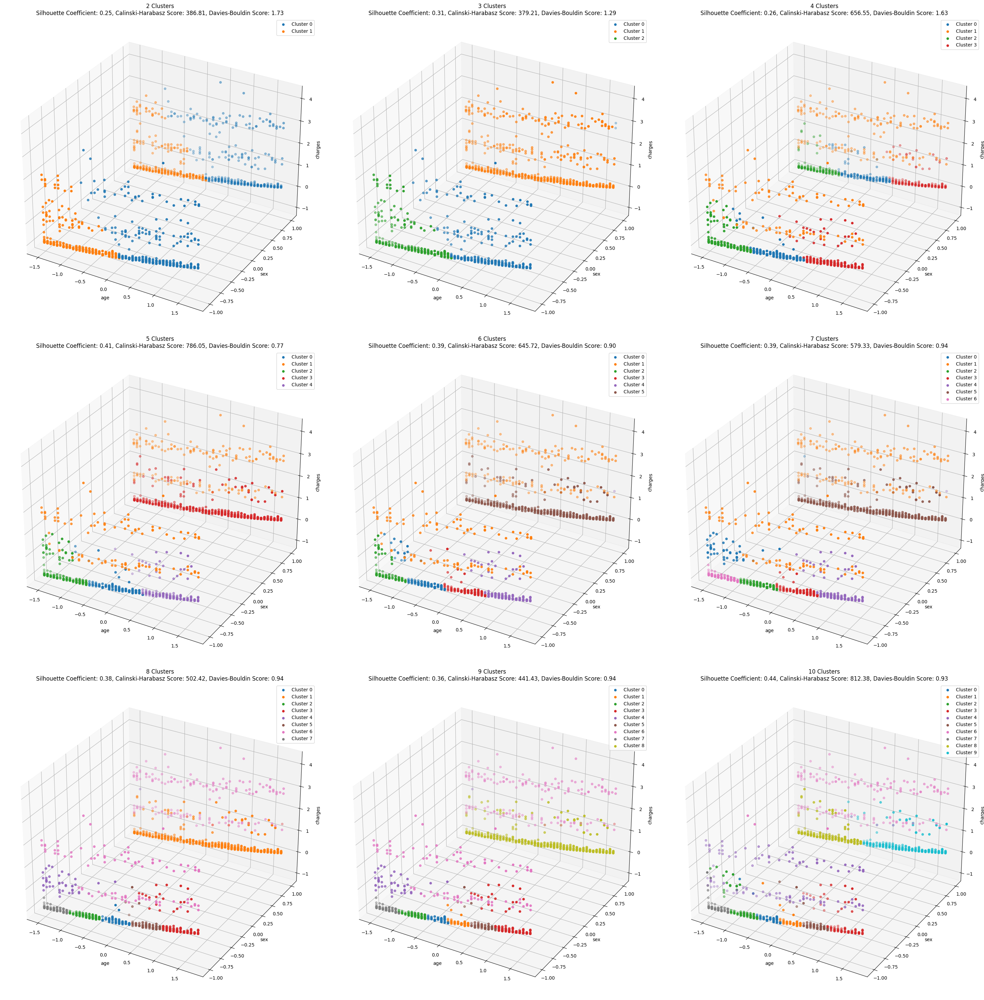

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from sklearn.preprocessing import StandardScaler

# Select the features to use for clustering
selected_features = ['age', 'sex', 'smoker', 'charges']

# Extract the selected features from the data
selected_data = df[selected_features]

# Standardize the selected features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(selected_data)

# Create a figure for subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 30), subplot_kw={'projection': '3d'})

# Iterate through different numbers of clusters and visualize
for n_clusters, ax in zip(range(2, 11), axes.flat):
    # Perform K-Medoids Clustering
    kmedoids = KMedoids(n_clusters=n_clusters)
    cluster_labels = kmedoids.fit_predict(X_scaled)

    # Calculate silhouette coefficient, Calinski-Harabasz score, and Davies-Bouldin score
    silhouette = silhouette_score(X_scaled, cluster_labels)
    calinski_harabasz = calinski_harabasz_score(X_scaled, cluster_labels)
    davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels)

    # Scatter plot for each cluster
    for cluster_label in range(n_clusters):
        cluster_points = X_scaled[cluster_labels == cluster_label]
        ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 3], label=f'Cluster {cluster_label}')

    ax.set_xlabel(selected_features[0])
    ax.set_ylabel(selected_features[1])
    ax.set_zlabel(selected_features[3])
    ax.set_title(f'{n_clusters} Clusters\n'
                 f'Silhouette Coefficient: {silhouette:.2f}, '
                 f'Calinski-Harabasz Score: {calinski_harabasz:.2f}, '
                 f'Davies-Bouldin Score: {davies_bouldin:.2f}')
    ax.legend()

plt.tight_layout()
plt.show()


# Fuzzy K-Medoids



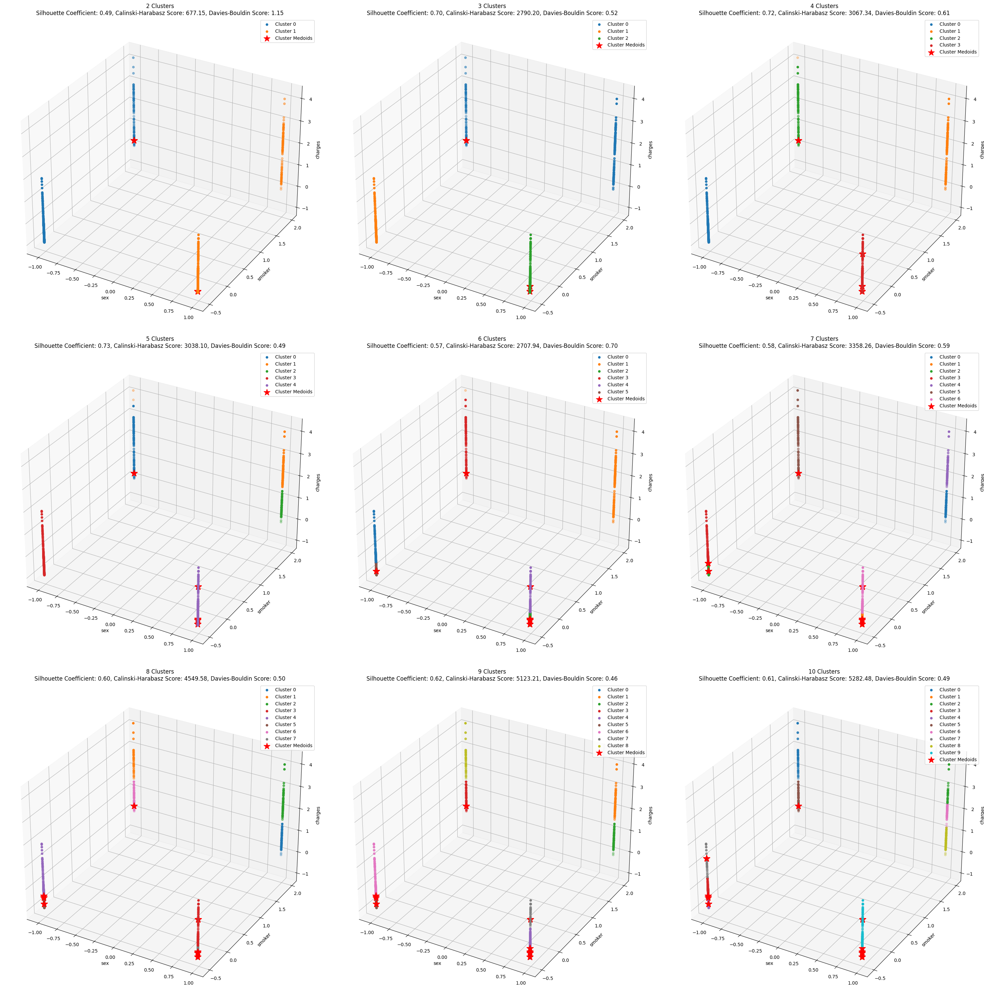

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from skfuzzy.cluster import cmeans
import numpy as np

# Select the features to use for clustering
selected_features = ['sex', 'smoker', 'charges']

# Extract the selected features from the data
selected_data = df[selected_features]

# Standardize the selected features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(selected_data)

# Create a figure for subplots
fig, axes = plt.subplots(3, 3, figsize=(30, 30), subplot_kw={'projection': '3d'})

# Iterate through different numbers of clusters and visualize
for n_clusters, ax in zip(range(2, 11), axes.flat):
    # Perform Fuzzy K-Medoids Clustering
    cntr, u, u0, d, jm, p, fpc = cmeans(X_scaled.T, n_clusters, 2, error=0.005, maxiter=1000)

    # Get the medoids
    medoids_idx = np.argmax(u, axis=0)

    # Calculate silhouette coefficient, Calinski-Harabasz score, and Davies-Bouldin score
    silhouette = silhouette_score(X_scaled, medoids_idx)
    calinski_harabasz = calinski_harabasz_score(X_scaled, medoids_idx)
    davies_bouldin = davies_bouldin_score(X_scaled, medoids_idx)

    # Scatter plot for each cluster
    for cluster_label in range(n_clusters):
        cluster_points = X_scaled[medoids_idx == cluster_label]
        ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f'Cluster {cluster_label}')

    # Markers for cluster centers (medoids)
    medoids = X_scaled[medoids_idx]
    ax.scatter(medoids[:, 0], medoids[:, 1], medoids[:, 2],
               marker='*', color='red', s=200, label='Cluster Medoids')

    ax.set_xlabel(selected_features[0])
    ax.set_ylabel(selected_features[1])
    ax.set_zlabel(selected_features[2])
    ax.set_title(f'{n_clusters} Clusters\n'
                 f'Silhouette Coefficient: {silhouette:.2f}, '
                 f'Calinski-Harabasz Score: {calinski_harabasz:.2f}, '
                 f'Davies-Bouldin Score: {davies_bouldin:.2f}')
    ax.legend()

plt.tight_layout()
plt.show()


# DB Scan

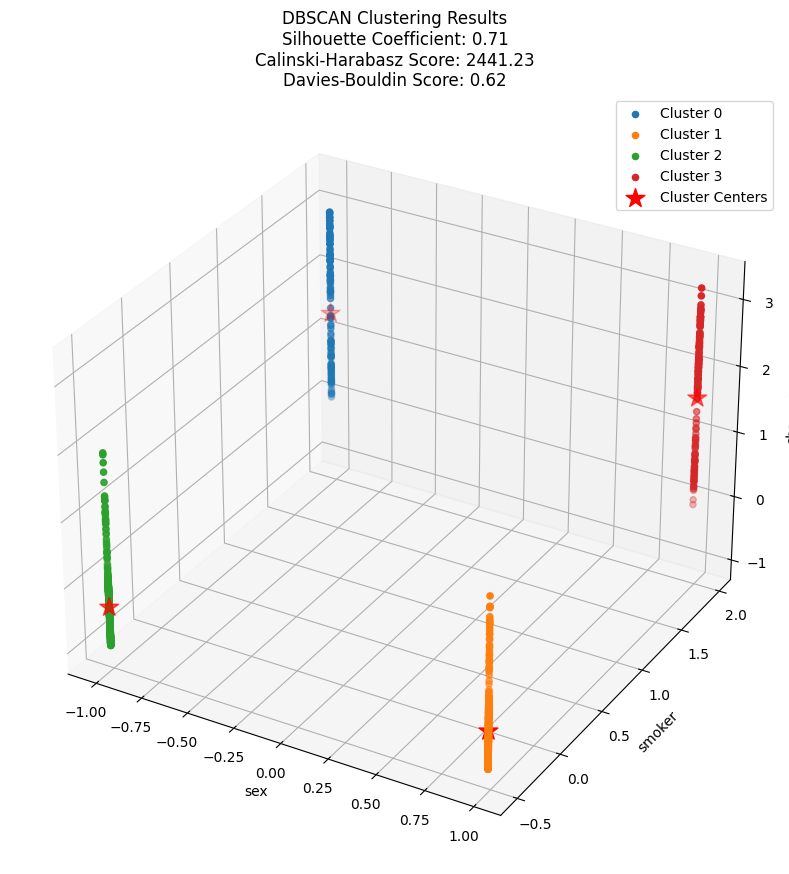

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import numpy as np

# Select the features to use for clustering
selected_features = ['sex', 'smoker', 'charges']

# Extract the selected features from the data
selected_data = df[selected_features]

# Standardize the selected features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(selected_data)

# Initialize DBSCAN model
dbscan = DBSCAN()

# Fit DBSCAN model to the data
cluster_labels_dbscan = dbscan.fit_predict(X_scaled)

# Get unique cluster labels (excluding noise, which is labeled as -1)
unique_clusters = set(cluster_labels_dbscan[cluster_labels_dbscan != -1])

# Create a figure for subplots
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for each cluster
for cluster_label in unique_clusters:
    cluster_points = X_scaled[cluster_labels_dbscan == cluster_label]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f'Cluster {cluster_label}')

# Markers for cluster centers
cluster_centers = []
for cluster_label in unique_clusters:
    cluster_points = X_scaled[cluster_labels_dbscan == cluster_label]
    cluster_center = cluster_points.mean(axis=0)
    cluster_centers.append(cluster_center)
cluster_centers = np.array(cluster_centers)
ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2],
           marker='*', color='red', s=200, label='Cluster Centers')

# Calculate silhouette coefficient, Calinski-Harabasz score, and Davies-Bouldin score
silhouette = silhouette_score(X_scaled, cluster_labels_dbscan)
calinski_harabasz = calinski_harabasz_score(X_scaled, cluster_labels_dbscan)
davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels_dbscan)

ax.set_xlabel(selected_features[0])
ax.set_ylabel(selected_features[1])
ax.set_zlabel(selected_features[2])
ax.set_title(f'DBSCAN Clustering Results\n'
             f'Silhouette Coefficient: {silhouette:.2f}\n'
             f'Calinski-Harabasz Score: {calinski_harabasz:.2f}\n'
             f'Davies-Bouldin Score: {davies_bouldin:.2f}')
ax.legend()

plt.show()


In [ ]:
import pandas as pd

y_dbscan = dbscan.labels_  # Get cluster labels from DBSCAN

# Create a DataFrame to store cluster points
cluster_data_dbscan = {}

for cluster in np.unique(y_dbscan):
    if cluster == -1:
        cluster_data_dbscan["Noise Points"] = X_scaled[y_dbscan == cluster]
    else:
        cluster_data_dbscan[f"Cluster {cluster}"] = X_scaled[y_dbscan == cluster]

# Display cluster points in a table format
for cluster_label, points in cluster_data_dbscan.items():
    print(cluster_label + ":")
    if len(points) > 0:
        display(pd.DataFrame(points, columns=selected_features))
    else:
        print("No points in this cluster.\n")


Noise Points:


,sex,smoker,charges
0,-1.010519,1.970587,4.171663
1,-1.010519,1.970587,3.742159
2,-1.010519,1.970587,3.458348
3,0.989591,1.970587,3.861966
4,0.989591,1.970587,4.074389


Cluster 0:


,sex,smoker,charges
0,-1.010519,1.970587,0.298584
1,-1.010519,1.970587,1.200968
2,-1.010519,1.970587,2.018214
3,-1.010519,1.970587,0.823954
4,-1.010519,1.970587,0.119064
...,...,...,...
107,-1.010519,1.970587,1.704205
108,-1.010519,1.970587,1.910469
109,-1.010519,1.970587,0.453964
110,-1.010519,1.970587,2.529924


Cluster 1:


,sex,smoker,charges
0,0.989591,-0.507463,-0.953689
1,0.989591,-0.507463,-0.728675
2,0.989591,-0.507463,0.719843
3,0.989591,-0.507463,-0.776802
4,0.989591,-0.507463,-0.567017
...,...,...,...
512,0.989591,-0.507463,-0.745987
513,0.989591,-0.507463,-0.010498
514,0.989591,-0.507463,-0.321550
515,0.989591,-0.507463,-0.243296


Cluster 2:


,sex,smoker,charges
0,-1.010519,-0.507463,-0.785908
1,-1.010519,-0.507463,-0.415500
2,-1.010519,-0.507463,-0.494728
3,-1.010519,-0.507463,1.293027
4,-1.010519,-0.507463,-0.180059
...,...,...,...
542,-1.010519,-0.507463,-0.204410
543,-1.010519,-0.507463,-0.153545
544,-1.010519,-0.507463,-0.914002
545,-1.010519,-0.507463,-0.961596


Cluster 3:


,sex,smoker,charges
0,0.989591,1.970587,2.175983
1,0.989591,1.970587,1.946807
2,0.989591,1.970587,2.101574
3,0.989591,1.970587,1.843392
4,0.989591,1.970587,3.132806
...,...,...,...
152,0.989591,1.970587,2.763024
153,0.989591,1.970587,2.028775
154,0.989591,1.970587,0.659945
155,0.989591,1.970587,0.677549


In [ ]:
import pandas as pd

# Extract cluster center coordinates
cluster_centers_df = pd.DataFrame(cluster_centers, columns=selected_features)

# Display the cluster center coordinates
print("Cluster Centers Coordinates:")
print(cluster_centers_df)


Cluster Centers Coordinates:
        sex    smoker   charges
0 -1.010519  1.970587  1.375056
1  0.989591 -0.507463 -0.428171
2 -1.010519 -0.507463 -0.372403
3  0.989591  1.970587  1.603531


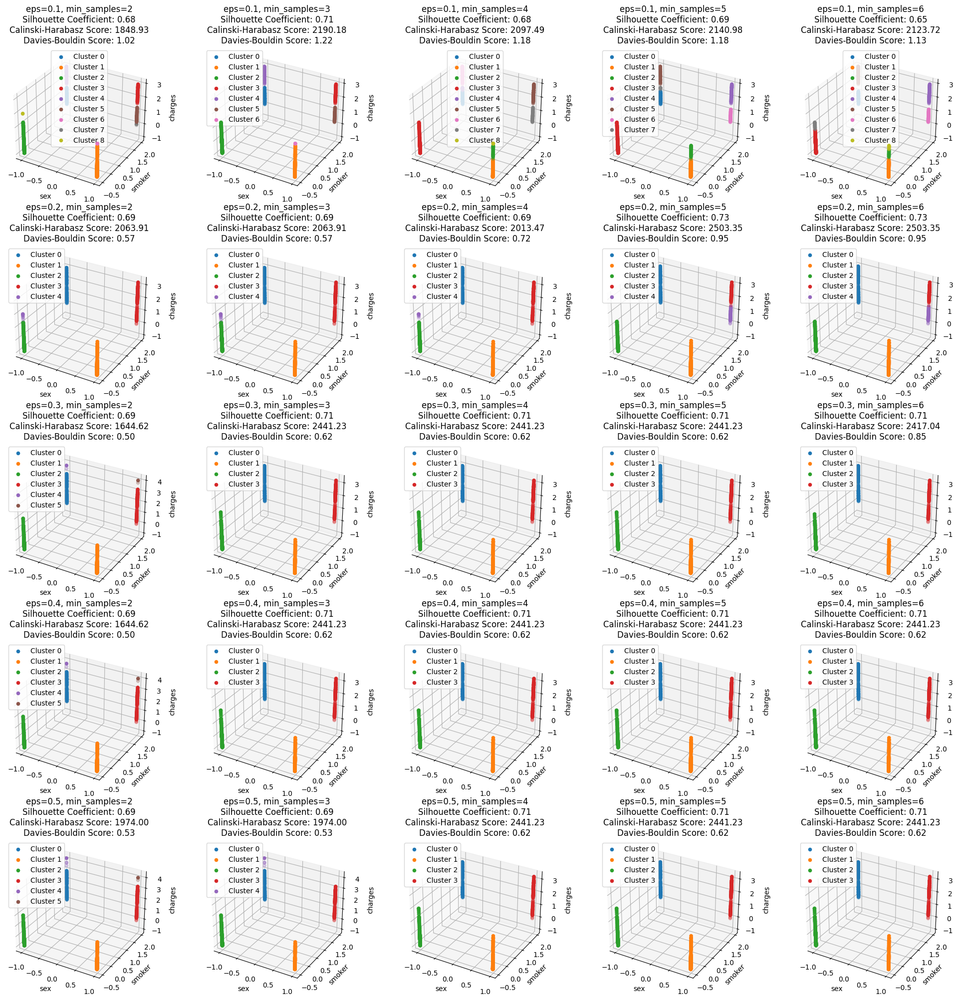

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import numpy as np

# Select the features to use for clustering
selected_features = ['sex', 'smoker', 'charges']

# Extract the selected features from the data
selected_data = df[selected_features]

# Standardize the selected features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(selected_data)

# Define a range of eps and min_samples values to try
eps_values = [0.1, 0.2, 0.3, 0.4, 0.5]
min_samples_values = [2, 3, 4, 5, 6]

# Create a figure for subplots
fig = plt.figure(figsize=(20, 20))

# Iterate through different combinations of eps and min_samples values
for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        # Initialize DBSCAN model
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)

        # Fit DBSCAN model to the data
        cluster_labels_dbscan = dbscan.fit_predict(X_scaled)

        # Calculate silhouette coefficient, Calinski-Harabasz score, and Davies-Bouldin score
        silhouette = silhouette_score(X_scaled, cluster_labels_dbscan)
        calinski_harabasz = calinski_harabasz_score(X_scaled, cluster_labels_dbscan)
        davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels_dbscan)

        # Create a 3D subplot
        ax = fig.add_subplot(len(eps_values), len(min_samples_values), i * len(min_samples_values) + j + 1, projection='3d')

        # Get unique cluster labels (excluding noise, which is labeled as -1)
        unique_clusters = set(cluster_labels_dbscan[cluster_labels_dbscan != -1])

        # Plot clusters
        for cluster_label in unique_clusters:
            cluster_points = X_scaled[cluster_labels_dbscan == cluster_label]
            ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f'Cluster {cluster_label}')

        ax.set_xlabel(selected_features[0])
        ax.set_ylabel(selected_features[1])
        ax.set_zlabel(selected_features[2])
        ax.set_title(f'eps={eps}, min_samples={min_samples}\n'
                     f'Silhouette Coefficient: {silhouette:.2f}\n'
                     f'Calinski-Harabasz Score: {calinski_harabasz:.2f}\n'
                     f'Davies-Bouldin Score: {davies_bouldin:.2f}')
        ax.legend()

plt.tight_layout()
plt.show()


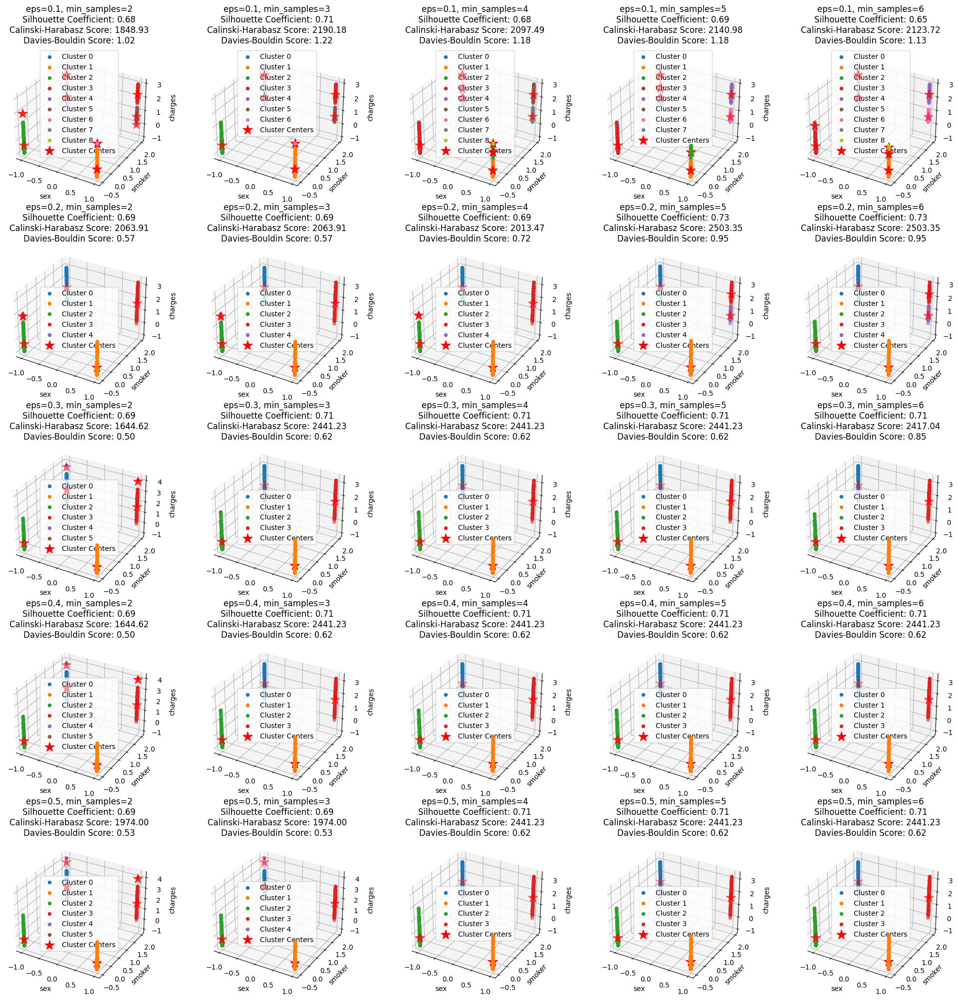

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import numpy as np

# Select the features to use for clustering
selected_features = ['sex', 'smoker', 'charges']

# Extract the selected features from the data
selected_data = df[selected_features]

# Standardize the selected features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(selected_data)

# Define a range of eps and min_samples values to try
eps_values = [0.1, 0.2, 0.3, 0.4, 0.5]
min_samples_values = [2, 3, 4, 5, 6]

# Create a figure for subplots
fig = plt.figure(figsize=(20, 20))

# Iterate through different combinations of eps and min_samples values
for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        # Initialize DBSCAN model
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)

        # Fit DBSCAN model to the data
        cluster_labels_dbscan = dbscan.fit_predict(X_scaled)

        # Calculate silhouette coefficient, Calinski-Harabasz score, and Davies-Bouldin score
        silhouette = silhouette_score(X_scaled, cluster_labels_dbscan)
        calinski_harabasz = calinski_harabasz_score(X_scaled, cluster_labels_dbscan)
        davies_bouldin = davies_bouldin_score(X_scaled, cluster_labels_dbscan)

        # Create a 3D subplot
        ax = fig.add_subplot(len(eps_values), len(min_samples_values), i * len(min_samples_values) + j + 1, projection='3d')

        # Get unique cluster labels (excluding noise, which is labeled as -1)
        unique_clusters = set(cluster_labels_dbscan[cluster_labels_dbscan != -1])

        # Plot clusters
        for cluster_label in unique_clusters:
            cluster_points = X_scaled[cluster_labels_dbscan == cluster_label]
            ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], label=f'Cluster {cluster_label}')

        # Markers for cluster centers
        cluster_centers = []
        for cluster_label in unique_clusters:
            cluster_points = X_scaled[cluster_labels_dbscan == cluster_label]
            cluster_center = cluster_points.mean(axis=0)
            cluster_centers.append(cluster_center)
        cluster_centers = np.array(cluster_centers)
        ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2],
                   marker='*', color='red', s=200, label='Cluster Centers')

        ax.set_xlabel(selected_features[0])
        ax.set_ylabel(selected_features[1])
        ax.set_zlabel(selected_features[2])
        ax.set_title(f'eps={eps}, min_samples={min_samples}\n'
                     f'Silhouette Coefficient: {silhouette:.2f}\n'
                     f'Calinski-Harabasz Score: {calinski_harabasz:.2f}\n'
                     f'Davies-Bouldin Score: {davies_bouldin:.2f}')
        ax.legend()

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Initialize an empty list to store cluster center coordinates
cluster_centers_list = []

# Define a range of eps and min_samples values to try
eps_values = [0.1, 0.2, 0.3, 0.4, 0.5]
min_samples_values = [2, 3, 4, 5, 6]

# Iterate through different combinations of eps and min_samples values
for eps in eps_values:
    for min_samples in min_samples_values:
        # Initialize DBSCAN model
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)

        # Fit DBSCAN model to the data
        cluster_labels_dbscan = dbscan.fit_predict(X_scaled)

        # Get unique cluster labels (excluding noise, which is labeled as -1)
        unique_clusters = set(cluster_labels_dbscan[cluster_labels_dbscan != -1])

        # Get cluster center coordinates
        for cluster_label in unique_clusters:
            cluster_points = X_scaled[cluster_labels_dbscan == cluster_label]
            cluster_center = cluster_points.mean(axis=0)
            cluster_centers_list.append({'eps': eps,
                                         'min_samples': min_samples,
                                         'x_coordinate': cluster_center[0],
                                         'y_coordinate': cluster_center[1],
                                         'z_coordinate': cluster_center[2]})

# Create DataFrame from the list of cluster center coordinates
cluster_centers_df = pd.DataFrame(cluster_centers_list)

# Display the cluster center coordinates table
print("Cluster Centers Coordinates:")
print(cluster_centers_df)


Cluster Centers Coordinates:
     eps  min_samples  x_coordinate  y_coordinate  z_coordinate
0    0.1            2     -1.010519      1.970587      0.615139
1    0.1            2      0.989591     -0.507463     -0.446314
2    0.1            2     -1.010519     -0.507463     -0.392207
3    0.1            2      0.989591      1.970587      2.239830
4    0.1            2     -1.010519      1.970587      2.300459
..   ...          ...           ...           ...           ...
129  0.5            5      0.989591      1.970587      1.603531
130  0.5            6     -1.010519      1.970587      1.375056
131  0.5            6      0.989591     -0.507463     -0.428171
132  0.5            6     -1.010519     -0.507463     -0.372403
133  0.5            6      0.989591      1.970587      1.603531

[134 rows x 5 columns]


In [ ]:
cluster_centers_df.head()


,eps,min_samples,x_coordinate,y_coordinate,z_coordinate
0,0.1,2,-1.010519,1.970587,0.615139
1,0.1,2,0.989591,-0.507463,-0.446314
2,0.1,2,-1.010519,-0.507463,-0.392207
3,0.1,2,0.989591,1.970587,2.239830
4,0.1,2,-1.010519,1.970587,2.300459


In [ ]:
cluster_centers_df[(cluster_centers_df['eps'] == 0.1) & (cluster_centers_df['min_samples'] == 2)]

,eps,min_samples,x_coordinate,y_coordinate,z_coordinate
0,0.1,2,-1.010519,1.970587,0.615139
1,0.1,2,0.989591,-0.507463,-0.446314
2,0.1,2,-1.010519,-0.507463,-0.392207
3,0.1,2,0.989591,1.970587,2.239830
4,0.1,2,-1.010519,1.970587,2.300459
5,0.1,2,0.989591,1.970587,0.604558
6,0.1,2,0.989591,-0.507463,1.397985
7,0.1,2,0.989591,1.970587,0.001507
8,0.1,2,-1.010519,-0.507463,1.939205
